# Simple SSD on PennFudan

**Goal:** Implement and train simple network for detecting people on an image.
****
**Author:** Paweł Subko. Please send questions regarding this task to: P.Subko@mimuw.edu.pl .
****
**Deliverables:**

1. Jupyter notebook with the best result. Please keep all the logs in the jupyter notebook.

2. Short report describing how you solved key problems of the assignment (balancing classes, choosing anchors, parameters you trained with).

3. The best model in terms of metrics in *.ckpt format.
****



## Overview

In this task, **FOR THE TOTAL OF 10 points** one should (for details read text in the notebook):
- determine the size of the feasible anchors for the object detection task posed in this Assignment,
- build an object detection model using the variant of `SSD` with EfficientNet backbone,
- fill in gaps in implementation,
- train model and achive at least 55% mean average precision on test dataloader

Hints and comments:

- model architecture and loss are heavily, yet loosely inspired by [SSD](https://arxiv.org/abs/1512.02325) paper and by [Pytorch Implementation](https://github.com/NVIDIA/DeepLearningExamples/tree/master/PyTorch/Detection/SSD)

- be sure that you understand the concept of an anchor for object detection, covered during the lecture about Object Detection. There are many great tutorials and articles about it (e.g. [this](https://towardsdatascience.com/anchor-boxes-the-key-to-quality-object-detection-ddf9d612d4f9) one).

## Data description
Similar to [pytorch object detection finetuning tutorial](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html) we use PennFudan dataset. It has only one clas and for simplicity our implementation takes adventage of it. This dataset also contains other descriptors we ignore.

* Note1: Tip: to debug write tests or fast dev run/overfit, not the full training!
* Note2: `(H, W)` may correspond to height and width of original image or to spatial dimensions of tensor obtained by processing image, but possibly downsampled. Usually, it's clear from the context.
* Note3: Regarding sending tensors `.to(device=DEVICE)` <- you must apply it to every tensor you explicitly create outside of LightningModule. Other tensors are handled by pytorch_lightning.
* Note4: "Test" and "Valid" are used interchangeably.

# Prerequisites:

In [1]:
!wget https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip

--2022-05-06 07:50:22--  https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip
Resolving www.cis.upenn.edu (www.cis.upenn.edu)... 158.130.69.163, 2607:f470:8:64:5ea5::d
Connecting to www.cis.upenn.edu (www.cis.upenn.edu)|158.130.69.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 53723336 (51M) [application/zip]
Saving to: ‘PennFudanPed.zip’

PennFudanPed.zip    100%[===================>]  51.23M  56.9MB/s    in 0.9s    

2022-05-06 07:50:23 (56.9 MB/s) - ‘PennFudanPed.zip’ saved [53723336/53723336]



In [2]:
!unzip PennFudanPed.zip > /dev/null 2>&1

In [3]:
!pip install torchmetrics pytorch_lightning > /dev/null 2>&1

Let's start with useful imports:

In [4]:
import os

from functools import reduce
from typing import Optional, Dict, Tuple, List, Union

import torch
import torchvision
import random

import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from torchvision.ops import box_convert
from torchvision.transforms import functional as F
from torchvision.utils import draw_bounding_boxes

from torch import nn, Tensor
from torchvision.transforms import functional as F
from torchvision.transforms import transforms as T, InterpolationMode


torch.manual_seed(0)
random.seed(0)
np.random.seed(0)

Very useful for debug:

In [5]:
from utils import debug

# PARAMS
Let's define important parameters we'll use later (detect anomaly and fast_dev_run may come in handy later):



In [32]:
ACCELEREATOR = "gpu" # 'cpu' or 'gpu'  # MODIFY ME
DATASET_PATH = "./PennFudanPed"
INPUT_SIZE = 160  # DO NOT CHANGE

CLS_THRESHOLD = 0.5  # DO NOT CHANGE
IOU_THRESHOLD = 0.5  # DO NOT CHANGE
# ANCHOR_SHAPES = [(2,2), (3, 3)]  # MODIFY ME <- FILL IN WITH PROPER VALUES

ANCHOR_SHAPES = [(3, 2), (4, 1), (5, 2), (5, 3)]
EPOCHS = 400  # MODIFY ME

LEARNING_RATE = 0.001  # MODIFY ME
LR_DECAY = 0.997  # MODIFY ME

BATCH_SIZE_TRAIN = 8  # MODIFY ME
BATCH_SIZE_VALID = 8

COEFF_CLS = 2 * 1 / 10  # MODIFY ME
COEFF_REG = 2 * 9 / 10  # MODIFY ME

DETECT_ANOMALY = False
FAST_DEV_RUN = True

VAL_IMGS_TO_SEND = 2
VALID_SIZE = 10  # DO NOT CHANGE, valid results and your assignment score depend on it!
MULTIPLY_VALID_N_TIMES = 10  # DO NOT CHANGE, valid results and your assignment score depend on it!

NMS_THRESHOLD = 0.45  # DO NOT CHANGE, valid results and your assignment score depend on it!

DEVICE = 'cuda' if ACCELEREATOR=="gpu" else 'cpu'

# Transformations
The dataset is very small and we'll havily use the following augmentations (from pytorch object detection). You don't have to read this code super carefully.

In [7]:
import transforms as T

# Implement custom transformations (1 p.)
* Implement resizing of image and boxes. Resize should resize an image such that the shorter side of an image after resize is of the `shorter` size and aspect ratio is kept. Don't forget to resize boxes. `normalize_boxes` and `denormalize_boxes` - read comments. See class `Normalize`.



In [8]:
class Normalize(torch.nn.Module):
    def __init__(self):
        super(Normalize, self).__init__()

    def forward(self, image: Tensor,
                target: Optional[Dict[str, Tensor]] = None) -> Tuple[Tensor, Optional[Dict[str, Tensor]]]:
        W, H = F.get_image_size(image)
        target['boxes'] = normalize_boxes(target['boxes'], H, W)
        return normalize_image(image), target


class Resize(torch.nn.Module):
    def __init__(self, shorter):
        super(Resize, self).__init__()
        self.shorter = shorter

    def forward(self, image: Tensor,
                target: Optional[Dict[str, Tensor]] = None) -> Tuple[Tensor, Optional[Dict[str, Tensor]]]:
        
        #TODO
        W, H = F.get_image_size(image)
        if W <= H:
          boxes = normalize_boxes(target['boxes'], H, W)
          # syntax: F.resize(image, (h, w))
          image = F.resize(image, (int(H / W * self.shorter), self.shorter))
          W_, H_ = F.get_image_size(image)
          boxes = denormalize_boxes(boxes, H_, W_)
        else:
          boxes = normalize_boxes(target['boxes'], H, W)
          image = F.resize(image, (self.shorter, int(W / H * self.shorter)))
          W_, H_ = F.get_image_size(image)
          boxes = denormalize_boxes(boxes, H_, W_)
      
        target['boxes'] = boxes

        return image, target

def normalize_image(img):
  return (img - 0.5)/0.5


def denormalize(img):
    return ((img + 1) / 2) * 255 # div255 is perofmed by ToTensor


def normalize_boxes(boxes, H, W):
    """
    :param boxes: format [N, 4], xyxy
    :param H: image height int
    :param W: image width int
    :return: normalized boxes in format [N, 4], xyxy , xy in [0, 1]x[0, 1]
    """
    # TODO
    boxes_norm = boxes.clone()
    boxes_norm[:, 0] = boxes_norm[:, 0] / W
    boxes_norm[:, 1] = boxes_norm[:, 1] / H
    boxes_norm[:, 2] = boxes_norm[:, 2] / W
    boxes_norm[:, 3] = boxes_norm[:, 3] / H

    return boxes_norm


def denormalize_boxes(boxes, H, W):
    """
    :param boxes: normalized boxes in format [N, 4], xyxy , xy in [0, 1]x[0, 1]
    :param H: image height int
    :param W: image width int
    :return: normalized boxes in format [N, 4], xyxy, xy in [0, W]x[0, H]
    """
    # TODO
    boxes_denorm = boxes.clone()
    boxes_denorm[:, 0] = boxes_denorm[:, 0] * W
    boxes_denorm[:, 1] = boxes_denorm[:, 1] * H
    boxes_denorm[:, 2] = boxes_denorm[:, 2] * W
    boxes_denorm[:, 3] = boxes_denorm[:, 3] * H
    
    return boxes_denorm

# Dataset

In [9]:
class PennFudanDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "PNGImages"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "PedMasks"))))

    def __getitem__(self, idx):
        # load images and masks
        img_path = os.path.join(self.root, "PNGImages", self.imgs[idx])
        mask_path = os.path.join(self.root, "PedMasks", self.masks[idx])
        img = Image.open(img_path).convert("RGB")
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background
        mask = Image.open(mask_path)
        # convert the PIL Image into a numpy array
        mask = np.array(mask)
        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]

        # split the color-encoded mask into a set
        # of binary masks
        masks = mask == obj_ids[:, None, None]

        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        target = {'boxes': boxes}

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        boxes = target['boxes']

        return img, boxes

    def __len__(self):
        return len(self.imgs)


In [10]:
def get_transform(train: bool, input_size: int):
    trans = [
        T.PILToTensor(),
        T.ConvertImageDtype(torch.float32),
        Resize(shorter=128)
    ]
    RIC = T.RandomIoUCrop(min_scale=0.8, max_scale=1.1, min_aspect_ratio=0.7, max_aspect_ratio=1.3)
    if train:
        trans += [T.RandomPhotometricDistort()]
    trans += [T.RandomHorizontalFlip(), RIC, T.RandomZoomOut(side_range=(1.0, 1.7), p=1.0)
              ]
    H, W = (input_size, input_size)
    trans += [T.FixedSizeCrop((H, W)), Normalize()]

    transform = T.Compose(trans)
    return transform

def collate_fn(batch):
    return tuple(zip(*batch))


def get_dataloader(data_path, train: bool, batch_size, input_size):
    dataset = PennFudanDataset(data_path, get_transform(train, input_size))

    indices = list(range(len(dataset)))
    if train:
        indices = indices[:-VALID_SIZE]
    else:
        indices = indices[-VALID_SIZE:]


    dataset = torch.utils.data.Subset(dataset, indices)

    if not train:
        dataset = torch.utils.data.ConcatDataset([dataset]*MULTIPLY_VALID_N_TIMES)
    
    print("Dataset size:", len(dataset))

    dataloader = torch.utils.data.DataLoader(dataset, batch_size, shuffle=train, num_workers=2, collate_fn=collate_fn, pin_memory=True)

    return dataloader


def show_sample(dataloader, num_samples=1):
    for _ in range(num_samples):
        img, target = next(iter(dataloader))
        res_imgs = []

        for i in range(min([len(img), 8])):
            boxes = target[i]
            im = img[i]
            im = denormalize(im).byte()
            bb = denormalize_boxes(boxes, im.shape[1], im.shape[2])
            im2 = draw_bounding_boxes(im, bb, colors=(255, 0, 0))
            res_imgs.append(im2)
        res_imgs = torch.stack(res_imgs, dim=0)
        res_grid = torchvision.utils.make_grid(res_imgs)
        res_grid = res_grid.permute([1, 2, 0])
        plt.imshow(res_grid/255)
        plt.show()


Dataset size: 160
Train:


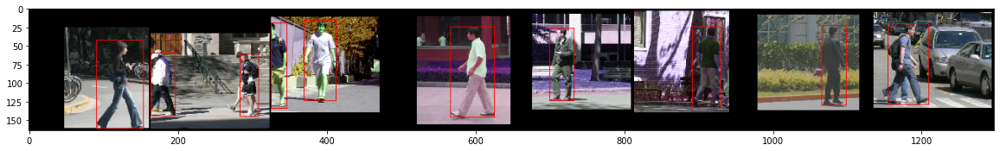

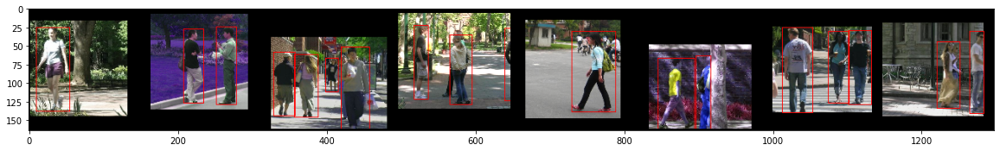

Dataset size: 100
Test:


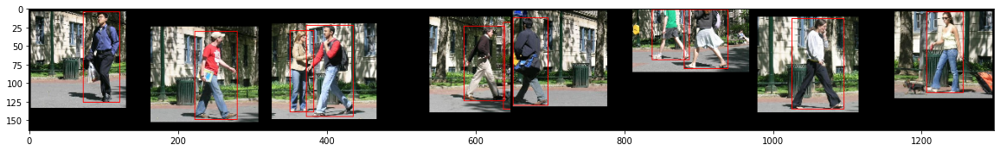

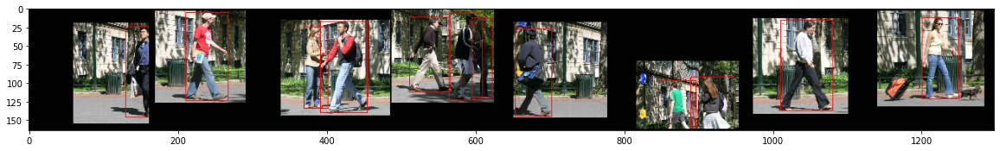

In [11]:
plt.rcParams['figure.figsize'] = [20, 20]

dataloader_train = get_dataloader(DATASET_PATH,
                                  train=True,
                                  batch_size=BATCH_SIZE_TRAIN,
                                  input_size=INPUT_SIZE
                                  )
print("Train:")
show_sample(dataloader_train, num_samples=2)


dataloader_test = get_dataloader(DATASET_PATH,
                                 train=False,
                                 batch_size=BATCH_SIZE_VALID,
                                 input_size=INPUT_SIZE
                                 )
print("Test:")
show_sample(dataloader_test, num_samples=2)


Important note: Our test data is very small. To extend our validation we also augment test dataset. We assume that our test data comes from such distribution. To avoid bad seed/randomization problems we multiply it many times (`MULTIPLY_TEST_N_TIMES` times).

# Implement Neural Network (1 p.)
For bakcbone use EfficientNet B2 pretrained on ImageNet.
* Implement missing methods.


In [12]:
import torch.nn as nn

from torchvision.models import efficientnet_b2

B2_OUT_VECTORS = 1408


class Head(nn.Module):
    def __init__(self, channels_in, anchor_shape):
        super(Head, self).__init__()
        self.loc = nn.Conv2d(channels_in, 4, kernel_size=3, padding=1)
        self.classif = nn.Conv2d(channels_in, 1, kernel_size=3, padding=1)

    def forward(self, x):
        reg = self.loc(x)
        cls = self.classif(x)

        return cls, reg


class EfficientSSD(nn.Module):
    def __init__(self, anchor_shapes):
        super(EfficientSSD, self).__init__()
        self.anchor_shapes = anchor_shapes
        self.backbone = efficientnet_b2(pretrained=True)
        self.heads = nn.ModuleList([Head(B2_OUT_VECTORS, anchor_shape) for anchor_shape in anchor_shapes])


    def forward(self, x):
        features = self.backbone.features(x)
        return [head(features) for head in self.heads]

In [13]:
tensor = torch.ones(size=(16, 3, 128, 256))


def test_efficientnet_ssd():
    net = EfficientSSD(anchor_shapes=[(2,2), (3,3)])
    res = net(tensor)
    print(res[0][0].shape)
    print(res[0][1].shape)
    print(len(res))


test_efficientnet_ssd()

Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-bcdf34b7.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-bcdf34b7.pth


  0%|          | 0.00/35.2M [00:00<?, ?B/s]

torch.Size([16, 1, 4, 8])
torch.Size([16, 4, 4, 8])
2


# Implement generating proposals. (1 p.)
Note that at this point coordinates of boxes are in [0, 1]. Proposals size on the image should be computed using [formula for receptive field](https://www.baeldung.com/cs/cnn-receptive-field-size) or some approximation.
* Implement missing functions.

In [14]:
def generate_indexes(shape):
    """
    generate center of the anchor
    :param shape: (H,W)
    """
    # TODO
    H, W = shape
    ys = torch.linspace(0, 1, steps=2*H+1)[1:-1:2]
    xs = torch.linspace(0, 1, steps=2*W+1)[1:-1:2]
    xs = xs.repeat(H, 1)
    ys = ys.reshape((H, 1))
    ys = ys.repeat(1, W)
    return xs, ys


def generate_proposals(anchor_shape, output_spatial_shape):
    """
    :param anchor_shape: (H, W)
    :param output_spatial_shape: (H, W)
    :return: tensor [4, H, W], coords format cxcywh all in [0, 1]
    """
    xs, ys = generate_indexes(output_spatial_shape)
    hs, ws = proposal_shape(anchor_shape, output_spatial_shape)
    res = torch.stack([xs, ys, ws, hs], dim=0)

    return res.to(device=DEVICE)


def proposal_shape(anchor_shape, output_spatial_shape):
    H, W = output_spatial_shape
    h, w = anchor_shape

    hs = torch.Tensor([h / H]).repeat(H * W).view(H, W)
    ws = torch.Tensor([w / W]).repeat(H * W).view(H, W)

    return hs, ws

In [15]:
# test by Maciej Pióro
test_shape = (2, 3)
generate_indexes_test_ys = torch.tensor(
    [[0.25, 0.25, 0.25],
    [0.75, 0.75, 0.75]]
)
generate_indexes_test_xs = torch.tensor(
    [[1/6, 3/6, 5/6],
    [1/6, 3/6, 5/6]]
)
generated_shape = generate_indexes(test_shape)
assert torch.allclose(generated_shape[0], generate_indexes_test_xs)
assert torch.allclose(generated_shape[1], generate_indexes_test_ys)

Lets define useful function when operating on boxes:

In [16]:
from utils import flatten_boxes_tensor

# Analyse proposals (1 p.)
* Modify previously defined ANCHOR_SIZES balancing training time and coverage of ground truth boxes. Report results.

In [ ]:
all_tuples = []
for i in range(1, 10):
  for j in range(1, 10):
    all_tuples.append((i, j))

In [ ]:
import itertools

combinations = []
comb = itertools.combinations(all_tuples, 3)
for c in comb:
  temp = []
  for t in c:
    temp.append(t)
  if temp not in combinations:
    print(temp)
    combinations.append(temp)

Strumieniowane dane wyjściowe obcięte do 5000 ostatnich wierszy.
[(6, 4), (8, 9), (9, 6)]
[(6, 4), (8, 9), (9, 7)]
[(6, 4), (8, 9), (9, 8)]
[(6, 4), (8, 9), (9, 9)]
[(6, 4), (9, 1), (9, 2)]
[(6, 4), (9, 1), (9, 3)]
[(6, 4), (9, 1), (9, 4)]
[(6, 4), (9, 1), (9, 5)]
[(6, 4), (9, 1), (9, 6)]
[(6, 4), (9, 1), (9, 7)]
[(6, 4), (9, 1), (9, 8)]
[(6, 4), (9, 1), (9, 9)]
[(6, 4), (9, 2), (9, 3)]
[(6, 4), (9, 2), (9, 4)]
[(6, 4), (9, 2), (9, 5)]
[(6, 4), (9, 2), (9, 6)]
[(6, 4), (9, 2), (9, 7)]
[(6, 4), (9, 2), (9, 8)]
[(6, 4), (9, 2), (9, 9)]
[(6, 4), (9, 3), (9, 4)]
[(6, 4), (9, 3), (9, 5)]
[(6, 4), (9, 3), (9, 6)]
[(6, 4), (9, 3), (9, 7)]
[(6, 4), (9, 3), (9, 8)]
[(6, 4), (9, 3), (9, 9)]
[(6, 4), (9, 4), (9, 5)]
[(6, 4), (9, 4), (9, 6)]
[(6, 4), (9, 4), (9, 7)]
[(6, 4), (9, 4), (9, 8)]
[(6, 4), (9, 4), (9, 9)]
[(6, 4), (9, 5), (9, 6)]
[(6, 4), (9, 5), (9, 7)]
[(6, 4), (9, 5), (9, 8)]
[(6, 4), (9, 5), (9, 9)]
[(6, 4), (9, 6), (9, 7)]
[(6, 4), (9, 6), (9, 8)]
[(6, 4), (9, 6), (9, 9)]
[(6, 4), (

In [ ]:
import itertools

combinations2 = []
comb = itertools.combinations(all_tuples, 2)
for c in comb:
  temp = []
  for t in c:
    temp.append(t)
  if temp not in combinations2:
    print(temp)
    combinations2.append(temp)

[(1, 1), (1, 2)]
[(1, 1), (1, 3)]
[(1, 1), (1, 4)]
[(1, 1), (1, 5)]
[(1, 1), (1, 6)]
[(1, 1), (1, 7)]
[(1, 1), (1, 8)]
[(1, 1), (1, 9)]
[(1, 1), (2, 1)]
[(1, 1), (2, 2)]
[(1, 1), (2, 3)]
[(1, 1), (2, 4)]
[(1, 1), (2, 5)]
[(1, 1), (2, 6)]
[(1, 1), (2, 7)]
[(1, 1), (2, 8)]
[(1, 1), (2, 9)]
[(1, 1), (3, 1)]
[(1, 1), (3, 2)]
[(1, 1), (3, 3)]
[(1, 1), (3, 4)]
[(1, 1), (3, 5)]
[(1, 1), (3, 6)]
[(1, 1), (3, 7)]
[(1, 1), (3, 8)]
[(1, 1), (3, 9)]
[(1, 1), (4, 1)]
[(1, 1), (4, 2)]
[(1, 1), (4, 3)]
[(1, 1), (4, 4)]
[(1, 1), (4, 5)]
[(1, 1), (4, 6)]
[(1, 1), (4, 7)]
[(1, 1), (4, 8)]
[(1, 1), (4, 9)]
[(1, 1), (5, 1)]
[(1, 1), (5, 2)]
[(1, 1), (5, 3)]
[(1, 1), (5, 4)]
[(1, 1), (5, 5)]
[(1, 1), (5, 6)]
[(1, 1), (5, 7)]
[(1, 1), (5, 8)]
[(1, 1), (5, 9)]
[(1, 1), (6, 1)]
[(1, 1), (6, 2)]
[(1, 1), (6, 3)]
[(1, 1), (6, 4)]
[(1, 1), (6, 5)]
[(1, 1), (6, 6)]
[(1, 1), (6, 7)]
[(1, 1), (6, 8)]
[(1, 1), (6, 9)]
[(1, 1), (7, 1)]
[(1, 1), (7, 2)]
[(1, 1), (7, 3)]
[(1, 1), (7, 4)]
[(1, 1), (7, 5)]
[(1, 1), (7, 6

In [ ]:
import itertools

combinations4 = []
comb = itertools.combinations(all_tuples, 4)
for c in comb:
  temp = []
  for t in c:
    temp.append(t)
  if temp not in combinations2:
    print(temp)
    combinations4.append(temp)

Strumieniowane dane wyjściowe obcięte do 5000 ostatnich wierszy.
[(7, 7), (8, 8), (9, 1), (9, 3)]
[(7, 7), (8, 8), (9, 1), (9, 4)]
[(7, 7), (8, 8), (9, 1), (9, 5)]
[(7, 7), (8, 8), (9, 1), (9, 6)]
[(7, 7), (8, 8), (9, 1), (9, 7)]
[(7, 7), (8, 8), (9, 1), (9, 8)]
[(7, 7), (8, 8), (9, 1), (9, 9)]
[(7, 7), (8, 8), (9, 2), (9, 3)]
[(7, 7), (8, 8), (9, 2), (9, 4)]
[(7, 7), (8, 8), (9, 2), (9, 5)]
[(7, 7), (8, 8), (9, 2), (9, 6)]
[(7, 7), (8, 8), (9, 2), (9, 7)]
[(7, 7), (8, 8), (9, 2), (9, 8)]
[(7, 7), (8, 8), (9, 2), (9, 9)]
[(7, 7), (8, 8), (9, 3), (9, 4)]
[(7, 7), (8, 8), (9, 3), (9, 5)]
[(7, 7), (8, 8), (9, 3), (9, 6)]
[(7, 7), (8, 8), (9, 3), (9, 7)]
[(7, 7), (8, 8), (9, 3), (9, 8)]
[(7, 7), (8, 8), (9, 3), (9, 9)]
[(7, 7), (8, 8), (9, 4), (9, 5)]
[(7, 7), (8, 8), (9, 4), (9, 6)]
[(7, 7), (8, 8), (9, 4), (9, 7)]
[(7, 7), (8, 8), (9, 4), (9, 8)]
[(7, 7), (8, 8), (9, 4), (9, 9)]
[(7, 7), (8, 8), (9, 5), (9, 6)]
[(7, 7), (8, 8), (9, 5), (9, 7)]
[(7, 7), (8, 8), (9, 5), (9, 8)]
[(7, 7), (8

In [ ]:
# we assume our neural network makes some downsamples
num_downsamples = 4

rescale = 2**num_downsamples

boxes = []
for dp in dataloader_train:
    imgs, targets = dp
    for i in range(BATCH_SIZE_TRAIN):
        for gt_boxes in targets[i]:
            boxes.append(gt_boxes)

boxes = torch.stack(boxes).to(device=DEVICE)

dp = next(iter(dataloader_train))
imgs, targets = dp
img = imgs[0]
H_out, W_out = img.shape[1] // rescale, img.shape[2] // rescale

best = []
best_score = 0

for ANCHOR_SHAPES in combinations2:
  masks = []
  for AS in ANCHOR_SHAPES:
      proposals = generate_proposals(AS, (H_out, W_out))
      proposals = flatten_boxes_tensor(proposals)
      proposals = box_convert(proposals, "cxcywh", "xyxy")

      #print(f"Generating proposals: anchor shape {AS}, spatial_shape: {(H_out, W_out)} \n")

      iou_matrix = torchvision.ops.box_iou(boxes, proposals)
      debug(iou_matrix, "iou_matrix")
      iou_max, idxes = iou_matrix.max(dim=1)
      mask = iou_max > IOU_THRESHOLD
      masks.append(mask)
  
  mask_final = reduce(torch.logical_or, masks)
  current = mask_final.sum()/len(boxes)*100
  if current > best_score:
    best_score = current
    best = ANCHOR_SHAPES

    print(f"In total, there is {mask_final.sum()}/{len(boxes)} gt boxes covered, that is {mask_final.sum()/len(boxes)*100:.2f} % \n")
    for i, (AS, m) in enumerate(zip(ANCHOR_SHAPES, masks)):
        print(f"Anchor {AS} covers {m.sum()}/{len(boxes)}, gt boxes, that is {m.sum()/len(boxes)*100:.2f} %")
        val = reduce(torch.logical_or, masks[:i] + masks[i+1:]).sum()
        added = mask_final.sum() - val
        print(f"Adding anchor {AS} covers additional: {added}/{len(boxes)} gt boxes, that is {added / len(boxes) * 100:.2f} % \n")
        print()


In total, there is 7/374 gt boxes covered, that is 1.87 % 

Anchor (1, 1) covers 0/374, gt boxes, that is 0.00 %
Adding anchor (1, 1) covers additional: 0/374 gt boxes, that is 0.00 % 


Anchor (2, 1) covers 7/374, gt boxes, that is 1.87 %
Adding anchor (2, 1) covers additional: 7/374 gt boxes, that is 1.87 % 


In total, there is 32/374 gt boxes covered, that is 8.56 % 

Anchor (1, 1) covers 0/374, gt boxes, that is 0.00 %
Adding anchor (1, 1) covers additional: 0/374 gt boxes, that is 0.00 % 


Anchor (3, 1) covers 32/374, gt boxes, that is 8.56 %
Adding anchor (3, 1) covers additional: 32/374 gt boxes, that is 8.56 % 


In total, there is 56/374 gt boxes covered, that is 14.97 % 

Anchor (1, 1) covers 0/374, gt boxes, that is 0.00 %
Adding anchor (1, 1) covers additional: 0/374 gt boxes, that is 0.00 % 


Anchor (3, 2) covers 56/374, gt boxes, that is 14.97 %
Adding anchor (3, 2) covers additional: 56/374 gt boxes, that is 14.97 % 


In total, there is 64/374 gt boxes covered, that 

In [ ]:
# we assume our neural network makes some downsamples
num_downsamples = 4

rescale = 2**num_downsamples

boxes = []
for dp in dataloader_train:
    imgs, targets = dp
    for i in range(BATCH_SIZE_TRAIN):
        for gt_boxes in targets[i]:
            boxes.append(gt_boxes)

boxes = torch.stack(boxes).to(device=DEVICE)

dp = next(iter(dataloader_train))
imgs, targets = dp
img = imgs[0]
H_out, W_out = img.shape[1] // rescale, img.shape[2] // rescale

best = []
best_score = 0

for ANCHOR_SHAPES in combinations:
  masks = []
  for AS in ANCHOR_SHAPES:
      proposals = generate_proposals(AS, (H_out, W_out))
      proposals = flatten_boxes_tensor(proposals)
      proposals = box_convert(proposals, "cxcywh", "xyxy")

      #print(f"Generating proposals: anchor shape {AS}, spatial_shape: {(H_out, W_out)} \n")

      iou_matrix = torchvision.ops.box_iou(boxes, proposals)
      debug(iou_matrix, "iou_matrix")
      iou_max, idxes = iou_matrix.max(dim=1)
      mask = iou_max > IOU_THRESHOLD
      masks.append(mask)
  
  mask_final = reduce(torch.logical_or, masks)
  current = mask_final.sum()/len(boxes)*100
  if current > best_score:
    best_score = current
    best = ANCHOR_SHAPES

    print(f"In total, there is {mask_final.sum()}/{len(boxes)} gt boxes covered, that is {mask_final.sum()/len(boxes)*100:.2f} % \n")
    for i, (AS, m) in enumerate(zip(ANCHOR_SHAPES, masks)):
        print(f"Anchor {AS} covers {m.sum()}/{len(boxes)}, gt boxes, that is {m.sum()/len(boxes)*100:.2f} %")
        val = reduce(torch.logical_or, masks[:i] + masks[i+1:]).sum()
        added = mask_final.sum() - val
        print(f"Adding anchor {AS} covers additional: {added}/{len(boxes)} gt boxes, that is {added / len(boxes) * 100:.2f} % \n")
        print()


In total, there is 8/372 gt boxes covered, that is 2.15 % 

Anchor (1, 1) covers 0/372, gt boxes, that is 0.00 %
Adding anchor (1, 1) covers additional: 0/372 gt boxes, that is 0.00 % 


Anchor (1, 2) covers 0/372, gt boxes, that is 0.00 %
Adding anchor (1, 2) covers additional: 0/372 gt boxes, that is 0.00 % 


Anchor (2, 1) covers 8/372, gt boxes, that is 2.15 %
Adding anchor (2, 1) covers additional: 8/372 gt boxes, that is 2.15 % 


In total, there is 36/372 gt boxes covered, that is 9.68 % 

Anchor (1, 1) covers 0/372, gt boxes, that is 0.00 %
Adding anchor (1, 1) covers additional: 0/372 gt boxes, that is 0.00 % 


Anchor (1, 2) covers 0/372, gt boxes, that is 0.00 %
Adding anchor (1, 2) covers additional: 0/372 gt boxes, that is 0.00 % 


Anchor (3, 1) covers 36/372, gt boxes, that is 9.68 %
Adding anchor (3, 1) covers additional: 36/372 gt boxes, that is 9.68 % 


In total, there is 59/372 gt boxes covered, that is 15.86 % 

Anchor (1, 1) covers 0/372, gt boxes, that is 0.00 %


In [ ]:
# we assume our neural network makes some downsamples
num_downsamples = 4

rescale = 2**num_downsamples

boxes = []
for dp in dataloader_train:
    imgs, targets = dp
    for i in range(BATCH_SIZE_TRAIN):
        for gt_boxes in targets[i]:
            boxes.append(gt_boxes)

boxes = torch.stack(boxes).to(device=DEVICE)

dp = next(iter(dataloader_train))
imgs, targets = dp
img = imgs[0]
H_out, W_out = img.shape[1] // rescale, img.shape[2] // rescale

best4 = []
best_score4 = 0

for ANCHOR_SHAPES in combinations4:
  masks = []
  for AS in ANCHOR_SHAPES:
      proposals = generate_proposals(AS, (H_out, W_out))
      proposals = flatten_boxes_tensor(proposals)
      proposals = box_convert(proposals, "cxcywh", "xyxy")

      #print(f"Generating proposals: anchor shape {AS}, spatial_shape: {(H_out, W_out)} \n")

      iou_matrix = torchvision.ops.box_iou(boxes, proposals)
      debug(iou_matrix, "iou_matrix")
      iou_max, idxes = iou_matrix.max(dim=1)
      mask = iou_max > IOU_THRESHOLD
      masks.append(mask)
  
  mask_final = reduce(torch.logical_or, masks)
  current = mask_final.sum()/len(boxes)*100
  if current > best_score4:
    best_score4 = current
    best4 = ANCHOR_SHAPES

    print(f"In total, there is {mask_final.sum()}/{len(boxes)} gt boxes covered, that is {mask_final.sum()/len(boxes)*100:.2f} % \n")
    for i, (AS, m) in enumerate(zip(ANCHOR_SHAPES, masks)):
        print(f"Anchor {AS} covers {m.sum()}/{len(boxes)}, gt boxes, that is {m.sum()/len(boxes)*100:.2f} %")
        val = reduce(torch.logical_or, masks[:i] + masks[i+1:]).sum()
        added = mask_final.sum() - val
        print(f"Adding anchor {AS} covers additional: {added}/{len(boxes)} gt boxes, that is {added / len(boxes) * 100:.2f} % \n")
        print()


In total, there is 9/375 gt boxes covered, that is 2.40 % 

Anchor (1, 1) covers 0/375, gt boxes, that is 0.00 %
Adding anchor (1, 1) covers additional: 0/375 gt boxes, that is 0.00 % 


Anchor (1, 2) covers 0/375, gt boxes, that is 0.00 %
Adding anchor (1, 2) covers additional: 0/375 gt boxes, that is 0.00 % 


Anchor (1, 3) covers 0/375, gt boxes, that is 0.00 %
Adding anchor (1, 3) covers additional: 0/375 gt boxes, that is 0.00 % 


Anchor (2, 1) covers 9/375, gt boxes, that is 2.40 %
Adding anchor (2, 1) covers additional: 9/375 gt boxes, that is 2.40 % 


In total, there is 28/375 gt boxes covered, that is 7.47 % 

Anchor (1, 1) covers 0/375, gt boxes, that is 0.00 %
Adding anchor (1, 1) covers additional: 0/375 gt boxes, that is 0.00 % 


Anchor (1, 2) covers 0/375, gt boxes, that is 0.00 %
Adding anchor (1, 2) covers additional: 0/375 gt boxes, that is 0.00 % 


Anchor (1, 3) covers 0/375, gt boxes, that is 0.00 %
Adding anchor (1, 3) covers additional: 0/375 gt boxes, that is 

Best ANCHOR_SHAPES for sizes:
* 2 
```
covered = 79.68 %
ANCHOR_SHAPES = [(4,1), (6,2)]
```
* 3 
```
covered = 87.37 %
ANCHOR_SHAPES = [(4,1), (5,2), (6,3)]
```
* 4
```
covered = 89.33 %
[(3, 2), (4, 1), (5, 2), (5, 3)]
```

In [ ]:
ANCHOR_SHAPES = [(3, 2), (4, 1), (5, 2), (5, 3)]

This is copied from pytroch implementation! Before we implement loss function we define encoding and decoding functions. This encoding simplifies targets of the network to realtive offsets from corresponding proposals. In our case `encode_boxes` will be called for gt_boxes and corresponding proposals and `decode_single` will be called for output of regression and corresponding proposals. `decode_single` is modified to take `weights` as param.


# Implement loss function (1 p.)
This a simple (haha), iterative version of loss function. Iterates over batch and over gt_box on the image and is supposed to compute smooth l1 between gt boxes and predicted encoded boxes coordinates and cross entropy between class predictions and targets.
* Add loss functions and implement some form of balancing/sampling between positive examples and negative examples (sampling, hard negative mining, weighting loss etc.)

In [17]:
from encode import encode_boxes, decode_single

In [18]:
from torch.nn.functional import smooth_l1_loss, binary_cross_entropy_with_logits


def compute_loss(outputs, gt_boxes, anchor_shape, reg_weights):
    """
    :param outputs: Tuple: (cls logits tensor [N, 1, H, W] - only single class, regression output as encoded boxes tensor [N, 4, H, W]), where N is batch_size
    :param gt_boxes: format [N, 4], xyxy, xy in [0,1] x [0,1]
    :param anchor_shape: (H, W)
    :return: classification and regression losses
    """
    output_cls, output_reg = outputs

    loss_reg_init = torch.tensor(0.0, requires_grad = True).to(device=DEVICE)
    loss_cls_init = torch.tensor(0.0, requires_grad = True).to(device=DEVICE)

    loss_reg = [loss_reg_init]
    loss_cls = [loss_cls_init]

    H_out, W_out = output_reg.shape[2], output_reg.shape[3]

    # iteratively for each image in a batch
    for i in range(len(output_reg)): # assert len(output) == batch_size
        gt_boxes_per_img = gt_boxes[i]
        out_reg_per_img = output_reg[i]
        out_reg_per_img = flatten_boxes_tensor(out_reg_per_img)

        out_cls_per_img = output_cls[i]
        out_cls_per_img = torch.reshape(out_cls_per_img, [1, H_out*W_out]).permute([1, 0])

        proposals = generate_proposals(anchor_shape, (H_out, W_out))
        proposals = flatten_boxes_tensor(proposals)
        proposals = box_convert(proposals, "cxcywh", "xyxy")

        iou_matrix = torchvision.ops.box_iou(gt_boxes_per_img, proposals)

        if iou_matrix.numel() != 0:
            debug(iou_matrix, "iou_matrix")

        if iou_matrix.shape[0] > 0:

            # iteratively for each image in a batch # You can improve it, but not necessarily.
            for j in range(len(gt_boxes_per_img)):
                gt_box = gt_boxes_per_img[j]
                matched_to_box = iou_matrix[j] > IOU_THRESHOLD
                matched_proposals = proposals[matched_to_box, :]

                encoded = encode_boxes(gt_box.expand(matched_proposals.shape), matched_proposals, weights=reg_weights)

                out_reg = out_reg_per_img[matched_to_box]

                if out_reg.shape[0] != 0:
                    # TODO
                    loss = smooth_l1_loss(out_reg, encoded)
                    loss_reg.append(loss)

            iou_max, idxes = iou_matrix.max(dim=0)

            # TODO you can use some version of sampling
            # After the matching step, most of the default boxes are negatives, 
            # especially when the number of possible default boxes is large. 
            # This introduces a significant imbalance between the positive and 
            # negative training examples. Instead of using all the negative examples, 
            # we sort them using the highest confidence loss for each default box 
            # and pick the top ones so that the ratio between the negatives 
            # and positives is at most 3:1.


            matched_to_any = iou_max > IOU_THRESHOLD
            # TODO later
            matched_to_any_count = matched_to_any.count_nonzero().item()
            if matched_to_any_count != 0:
                number_of_hard_negative = 3 * matched_to_any_count
            else:
                number_of_hard_negative = 3
            
            perc = (1 / matched_to_any.shape[0]) * number_of_hard_negative
            hard_negative = (torch.rand(matched_to_any.shape[0]) < perc).int().to(device=DEVICE)

            mask_cls = torch.logical_or(matched_to_any, hard_negative)

            if matched_to_any.count_nonzero():

                out_cls_ = torch.squeeze(out_cls_per_img).float()[mask_cls]
                targets_cls_ = matched_to_any.float()[mask_cls]

                # TODO
                POS_WEIGHT = torch.FloatTensor([2]).to(device=DEVICE)
                loss_cls_ = binary_cross_entropy_with_logits(out_cls_, targets_cls_, pos_weight=POS_WEIGHT)
                loss_cls.append(loss_cls_)

    loss_cls = torch.stack(loss_cls).sum()
    loss_reg = torch.stack(loss_reg).sum()
    return loss_cls, loss_reg


# Lightning model definition - implement predict_step (1 p.)
As metric we use Mean Average Precission, see [mAP](https://towardsdatascience.com/map-mean-average-precision-might-confuse-you-5956f1bfa9e2) and [mAP](https://jonathan-hui.medium.com/map-mean-average-precision-for-object-detection-45c121a31173). In postprocess we remove small boxes and we remove overlapping boxes with lower scores (non maximum suppression).

In [77]:
import pytorch_lightning as pt
from torch.optim.lr_scheduler import ExponentialLR
from torchmetrics.detection import MeanAveragePrecision


class SimpleModel(pt.LightningModule):
    def __init__(self, net):
        super().__init__()
        self._net = net
        self._map = MeanAveragePrecision().cpu()
        self._reg_weights = torch.from_numpy(np.array([1, 1, 1, 1])).to(device=DEVICE)

    def forward(self, x):
        return self._net(x)

    def on_epoch_start(self):
        self.log("lr", self.lr_schedulers().get_last_lr()[0])

    def on_epoch_end(self):
        self.lr_schedulers().step()

    def training_step(self, batch, batch_idx):
        imgs, gt_boxes = batch

        imgs = torch.stack(imgs, dim=0)

        outputs = self(imgs)

        loss_cls = 0
        loss_reg = 0

        for i, output in enumerate(outputs):
          loss_cls_, loss_reg_ = compute_loss(output, gt_boxes, self._net.anchor_shapes[i], self._reg_weights)

          loss_cls += loss_cls_
          loss_reg += loss_reg_

        # loss_cls, loss_reg = compute_loss(outputs[0], gt_boxes, self._net.anchor_shapes[0], self._reg_weights)
        # loss_cls2, loss_reg2 = compute_loss(outputs[1], gt_boxes, self._net.anchor_shapes[1], self._reg_weights)

        # loss_cls += loss_cls2
        # loss_reg += loss_reg2

        l_reg = COEFF_REG * loss_reg
        l_cls = COEFF_CLS * loss_cls
        loss = l_cls + l_reg
        self.log("reg_loss", l_reg)
        self.log("cls_loss", l_cls)

        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.RMSprop(self.parameters(), lr=LEARNING_RATE)
        return [optimizer], [ExponentialLR(optimizer, gamma=LR_DECAY)]

    
    def on_validation_epoch_start(self):
      self._map.cpu()
      self._map.reset()


    def validation_step(self, batch, batch_idx):
        imgs, targets = batch

        imgs = torch.stack(imgs, dim=0)

        outputs = self(imgs)

        self._map.cpu()

        res_imgs = []
        for i in range(len(imgs)):
            im = imgs[i]
            out_cls = outputs[0][0][i]
            out_reg = outputs[0][1][i]
            gt_boxes = targets[i]

            im = denormalize(im).byte()

            proposals = generate_proposals(self._net.anchor_shapes[0], (out_cls.shape[1], out_cls.shape[2]))

            scores, boxes = self.postprocess(out_cls, out_reg, cls_threshold=CLS_THRESHOLD, proposals=proposals)

            idxes = torchvision.ops.nms(boxes, scores, iou_threshold=NMS_THRESHOLD)
            boxes = boxes[idxes]
            scores = scores[idxes]

            H, W = im.shape[1], im.shape[2]

            if boxes.shape[0] > 0:
                boxes = denormalize_boxes(boxes, H, W)
            gt_bb = denormalize_boxes(gt_boxes, H, W)

            if batch_idx < VAL_IMGS_TO_SEND:
              im = draw_bounding_boxes(im.cpu(), gt_bb.cpu(), colors=(255, 0, 0))
              im = draw_bounding_boxes(im, boxes.cpu(), colors=(0, 255, 0))
              res_imgs.append(im)

            labels = torch.ones(scores.shape, dtype=torch.int32)
            labels2 = torch.ones(gt_boxes.shape[0], dtype=torch.int32)

            preds = [{"boxes": boxes.cpu(), "scores": scores.cpu(), "labels": labels.cpu()}]
            target = [{"boxes": gt_bb.cpu(), "labels": labels2.cpu()}]
            self._map.update(preds, target)
        
        if batch_idx < VAL_IMGS_TO_SEND:

          res_imgs = torch.stack(res_imgs, dim=0)

          res_grid = torchvision.utils.make_grid(res_imgs)
          self.logger.experiment.add_image(f'outputs{batch_idx}', res_grid, global_step=self.global_step)

        self.log('val_map', self._map.compute()['map'])

    
    def on_validatoin_epoch_end(self):
      self.log('val_map', self._map.compute()['map'])


    def predict_step(self, batch, batch_idx):
        """
        :returns list of tensors with boxes coordinates in format xyxy
        """
        imgs, targets = batch

        imgs = torch.stack(imgs, dim=0)
        outputs = self(imgs)

        res_imgs = []
        final_boxes = []

        for i in range(len(imgs)):
            im = imgs[i]
            out_cls = outputs[0][0][i]
            out_reg = outputs[0][1][i]
            gt_boxes = targets[i]

            im = denormalize(im).byte()

            proposals = generate_proposals(self._net.anchor_shapes[0], (out_cls.shape[1], out_cls.shape[2]))

            scores, boxes = self.postprocess(out_cls, out_reg, cls_threshold=CLS_THRESHOLD, proposals=proposals)

            idxes = torchvision.ops.nms(boxes, scores, iou_threshold=NMS_THRESHOLD)
            boxes = boxes[idxes]
            scores = scores[idxes]
            final_boxes.append(boxes)

            H, W = im.shape[1], im.shape[2]

            if boxes.shape[0] > 0:
                boxes = denormalize_boxes(boxes, H, W)
            gt_bb = denormalize_boxes(gt_boxes, H, W)

    
            im = draw_bounding_boxes(im.cpu(), gt_bb.cpu(), colors=(255, 0, 0))
            im = draw_bounding_boxes(im, boxes.cpu(), colors=(0, 255, 0))
            res_imgs.append(im)
        

        res_imgs = torch.stack(res_imgs, dim=0)

        res_grid = torchvision.utils.make_grid(res_imgs)
        res_grid = res_grid.permute([1, 2, 0])
        plt.imshow(res_grid/255)
        plt.show()
        return final_boxes
        

    def postprocess(self, out_cls, out_reg, cls_threshold, proposals):
        """
        out_reg -> "cxcywh"
        """
        scores = torch.sigmoid(out_cls)
        mask = scores >= cls_threshold

        proposals_boxes_ = proposals.expand(out_reg.shape)

        proposals_boxes_ = proposals_boxes_[:, mask.squeeze()]

        proposals_boxes_ = flatten_boxes_tensor(proposals_boxes_)

        out_reg = out_reg[mask.expand(out_reg.shape)]
        out_reg = flatten_boxes_tensor(out_reg)

        out_reg = decode_single(out_reg, proposals_boxes_, weights=self._reg_weights)

        scores = scores[mask]

        out_reg = torchvision.ops.clip_boxes_to_image(out_reg, (1, 1))
        idxes = torchvision.ops.remove_small_boxes(out_reg, min_size=1 / 100)

        out_reg = out_reg[idxes]
        scores = scores[idxes]

        return scores, out_reg


# Training and validation (2 p.)
You should achive > 55 mAP. After 2k steps results should start looking reasonable. On gpu it should run ~1Epoch/10s, so after ~15 minutes you should see some reasonable detections.
* Modify training paramters, optimizer, etc. and use other ML techniques of your choice (regularization, test time augmentation etc.).

In [20]:
%load_ext tensorboard

In [21]:
%tensorboard --logdir tb_logs

<IPython.core.display.Javascript object>

In [78]:
from pytorch_lightning.loggers import TensorBoardLogger


logger = TensorBoardLogger("tb_logs", name="my_model")

net = EfficientSSD(anchor_shapes=ANCHOR_SHAPES)
model = SimpleModel(net)

trainer = pt.Trainer(max_epochs=EPOCHS,
                     detect_anomaly=DETECT_ANOMALY,
                     logger=logger,
                     check_val_every_n_epoch=EPOCHS//20,
                     accelerator=ACCELEREATOR,
                     fast_dev_run=FAST_DEV_RUN,
                     profiler='simple',
                     log_every_n_steps=20
                     )

trainer.fit(model, dataloader_train, dataloader_test)
trainer.save_checkpoint("simple_ssd.ckpt")

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Running in fast_dev_run mode: will run a full train, val, test and prediction loop using 1 batch(es).
`Trainer(limit_train_batches=1)` was configured so 1 batch per epoch will be used.
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
`Trainer(limit_test_batches=1)` was configured so 1 batch will be used.
`Trainer(limit_predict_batches=1)` was configured so 1 batch will be used.
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:308: LightningDeprecationWarning: The `LightningModule.on_epoch_start` hook was deprecated in v1.6 and will be removed in v1.8. Please use `LightningModule.on_<train/validation/test>_epoch_start` instead.
  f"The `LightningModule.{hook}` hook was deprec

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

FIT Profiler Report

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Action                                                                                                                                                                                                    	|  Mean duration (s)	|  Num calls      	|  Total time (s) 	|  Percentage %   	|
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Total                                                                       

In [23]:
trainer.save_checkpoint("simple_ssd.ckpt")

In [24]:
!ls tb_logs

my_model


In [25]:
# !rm -r tb_logs

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:308: LightningDeprecationWarning: The `LightningModule.on_epoch_start` hook was deprecated in v1.6 and will be removed in v1.8. Please use `LightningModule.on_<train/validation/test>_epoch_start` instead.
  f"The `LightningModule.{hook}` hook was deprecated in v1.6 and"
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:308: LightningDeprecationWarning: The `LightningModule.on_epoch_end` hook was deprecated in v1.6 and will be removed in v1.8. Please use `LightningModule.on_<train/validation/test>_epoch_end` instead.
  f"The `LightningModule.{hook}` hook was deprecated in v1.6 and"
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 1it [00:00, ?it/s]

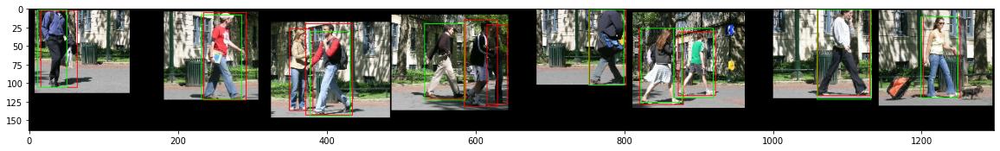

PREDICT Profiler Report

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Action                                                                                                                                                                                                    	|  Mean duration (s)	|  Num calls      	|  Total time (s) 	|  Percentage %   	|
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Total                                                                   

[[tensor([[0.0660, 0.0000, 0.3114, 0.6537]]),
  tensor([[0.4270, 0.0465, 0.7667, 0.7550]]),
  tensor([[0.3301, 0.1857, 0.6633, 0.8914]]),
  tensor([[0.2760, 0.1247, 0.6161, 0.7581]]),
  tensor([[0.6439, 0.0000, 0.9436, 0.6317]]),
  tensor([[0.0689, 0.1621, 0.4174, 0.7752],
          [0.3470, 0.1573, 0.6750, 0.7413]]),
  tensor([[0.5407, 0.0000, 0.9891, 0.7511]]),
  tensor([[0.3965, 0.0685, 0.7113, 0.7398]])]]

In [79]:
# checkpoint = torch.load("simple_ssd.ckpt")
checkpoint = torch.load("/content/tb_logs/my_model/version_0/checkpoints/epoch=399-step=8000.ckpt")

model.load_state_dict(checkpoint["state_dict"])

trainer.predict(model=model, dataloaders=[dataloader_test])

# Extend implementation to multiple ANCHORS (1 p.) and multiple output scales (1 p.)
It's ok if it's not completely general, but it has to be at more scales and/or using more anchors.

# Report

balancing classes, choosing anchors, parameters you trained with).

My neural net consists of efficient net backbone and heads for each anchor size. Each head consists of two components: classification and regression for boxes (these are just convolutional layers on the features of last layer of backbone).

My anchor choices were very simple -- I checked every combination of anchor sizes for 2, 3 and 4 anchors. Each potential anchor was a tuple $(i,j)$ where $i, j \in [2, 9]$. I've chcecked all the options to find the best coverage. 

Best ANCHOR_SHAPES for sizes:
* 2 
```
covered = 79.68 %
ANCHOR_SHAPES = [(4,1), (6,2)]
```
* 3 
```
covered = 87.37 %
ANCHOR_SHAPES = [(4,1), (5,2), (6,3)]
```
* 4
```
covered = 89.33 %
[(3, 2), (4, 1), (5, 2), (5, 3)]
```

In the final solution, I've used four anchors as it gave the best coverage.


In the negative sampling part I chose approach similar to the one in SSD paper -- I've checked how many ious vere above the treshold and randomly chose 3 times this amount for the negative samples. I wasn't paying attention to the indexes, indexes which I sampled could be the correct ones. It doesn't ruine the concept though, because the authors of the paper said that proportion **at most** 3:1 gives the best results.

I've also used POS_WEIGHT parameter in the binary crossentropy and set its value to 2, because it gave my model a little kick in the score (although it made my training a little bit chaotic in comparison to POS_WEIGHT equal 1).

The rest of the training parameters vere the same as proposed by the author of the task:
```
EPOCHS = 400 
LEARNING_RATE = 0.001
LR_DECAY = 0.997 
BATCH_SIZE_TRAIN = 8 
COEFF_CLS = 2 * 1 / 10  
COEFF_REG = 2 * 9 / 10  
```

Considering the final model and its score -- I've obtained 57,34% of mAP on validation set, which is above given treshold. 
The plots for classification loss, regression loss and mAP value are as follows
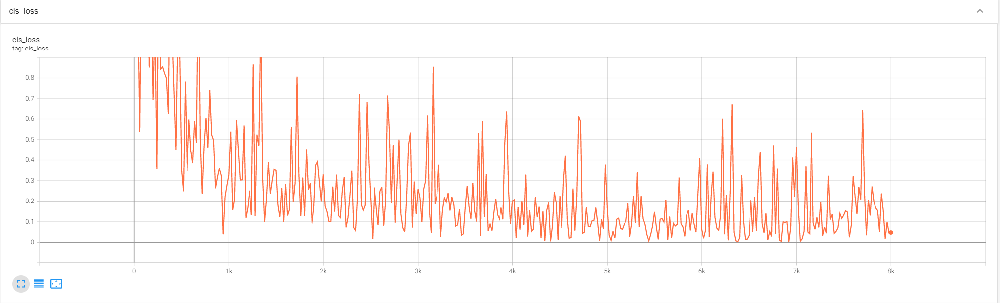
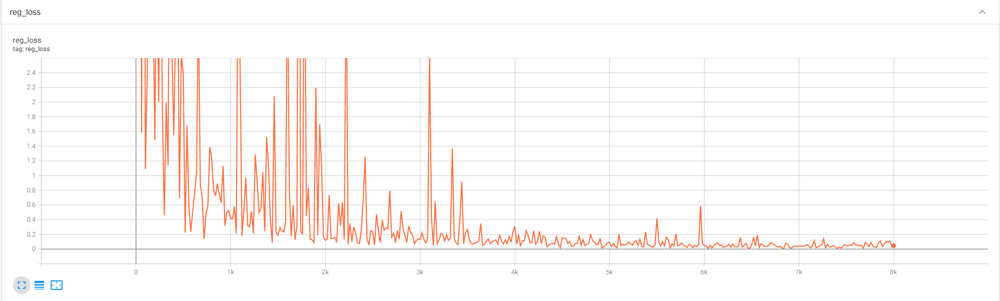
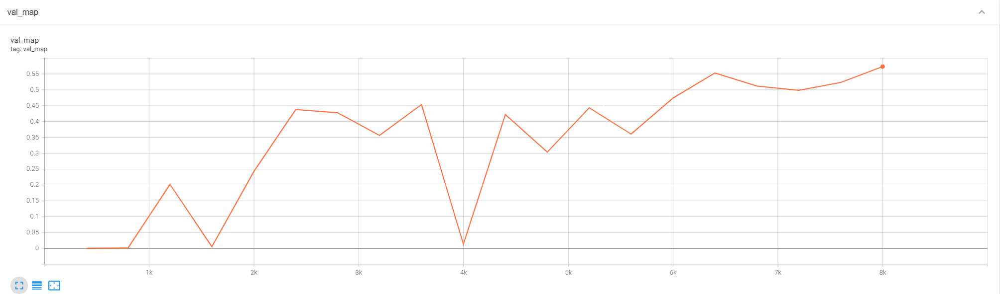

And sample output from predict step looks like this 
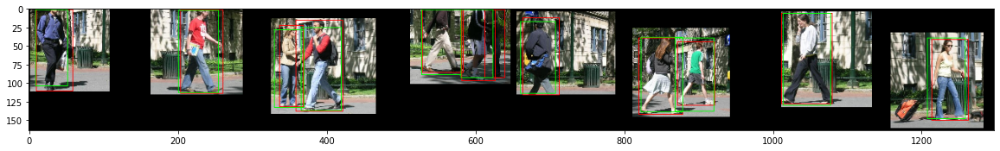

It seems that my model makes reasonalble predictions. One thing that I could improve is adding more anchor sizes.